In [1]:
import pandas as pd
from Chicago_Crimes_Cleaning import clean_data

df = pd.read_csv("Crimes_-_2001_to_Present.csv")

df_clean = clean_data(df) 

print(df_clean.head())

Year mismatches: 0
Duplicates: 0
         ID Case Number                Date                Block  IUCR  \
0  10224738    HY411648 2015-09-05 13:30:00      043XX S WOOD ST  0486   
1  10224739    HY411615 2015-09-04 11:30:00  008XX N CENTRAL AVE  0870   
3  10224740    HY411595 2015-09-05 12:45:00    035XX W BARRY AVE  2023   
4  10224741    HY411610 2015-09-05 13:00:00  0000X N LARAMIE AVE  0560   
5  10224742    HY411435 2015-09-05 10:55:00  082XX S LOOMIS BLVD  0610   

  Primary Type              Description Location Description  Arrest  \
0      BATTERY  DOMESTIC BATTERY SIMPLE            RESIDENCE   False   
1        THEFT           POCKET-PICKING              CTA BUS   False   
3    NARCOTICS    POSS: HEROIN(BRN/TAN)             SIDEWALK    True   
4      ASSAULT                   SIMPLE            APARTMENT   False   
5     BURGLARY           FORCIBLE ENTRY            RESIDENCE   False   

   Domestic  ...  Month  Day  Hour  DayOfWeek Working Hours  Evening  IsNight  \
0      T

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
import warnings
import calendar
import re

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
df_clean.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,Year,Latitude,Longitude,Location,Month,Day,Hour,DayOfWeek,Working Hours,Evening,IsNight,Weekend,Month_Name,Day_of_Week_Name
0,10224738,HY411648,2015-09-05 13:30:00,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,924,9.0,12.0,61.0,08B,2015,41.815117,-87.670000,"(41.815117282, -87.669999562)",9,5,13,5,True,False,False,True,September,Saturday
1,10224739,HY411615,2015-09-04 11:30:00,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,1511,15.0,29.0,25.0,06,2015,41.895080,-87.765400,"(41.895080471, -87.765400451)",9,4,11,4,True,False,False,False,September,Friday
3,10224740,HY411595,2015-09-05 12:45:00,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,1412,14.0,35.0,21.0,18,2015,41.937406,-87.716650,"(41.937405765, -87.716649687)",9,5,12,5,True,False,False,True,September,Saturday
4,10224741,HY411610,2015-09-05 13:00:00,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,1522,15.0,28.0,25.0,08A,2015,41.881903,-87.755121,"(41.881903443, -87.755121152)",9,5,13,5,True,False,False,True,September,Saturday
5,10224742,HY411435,2015-09-05 10:55:00,082XX S LOOMIS BLVD,0610,BURGLARY,FORCIBLE ENTRY,RESIDENCE,False,False,614,6.0,21.0,71.0,05,2015,41.744379,-87.658431,"(41.744378879, -87.658430635)",9,5,10,5,True,False,False,True,September,Saturday


In [5]:
df_clean['Location Description'].unique()

array(['RESIDENCE', 'CTA BUS', 'SIDEWALK', 'APARTMENT',
       'RESIDENCE-GARAGE', 'GROCERY FOOD STORE', 'STREET',
       'PARKING LOT/GARAGE(NON.RESID.)', 'SMALL RETAIL STORE', 'OTHER',
       'VEHICLE NON-COMMERCIAL', 'RESTAURANT', 'RESIDENCE PORCH/HALLWAY',
       'ALLEY', 'POLICE FACILITY/VEH PARKING LOT', 'LIBRARY',
       'ATHLETIC CLUB', 'DRUG STORE', 'PARK PROPERTY',
       'CHA PARKING LOT/GROUNDS', 'NURSING HOME/RETIREMENT HOME',
       'DRIVEWAY - RESIDENTIAL', 'RESIDENTIAL YARD (FRONT/BACK)',
       'COMMERCIAL / BUSINESS OFFICE', 'DEPARTMENT STORE', 'HOTEL/MOTEL',
       'GAS STATION', 'BAR OR TAVERN',
       'CHURCH/SYNAGOGUE/PLACE OF WORSHIP', 'SPORTS ARENA/STADIUM',
       'CONSTRUCTION SITE', 'HOSPITAL BUILDING/GROUNDS', 'CTA STATION',
       'TAVERN/LIQUOR STORE', 'CHA HALLWAY/STAIRWELL/ELEVATOR',
       'CONVENIENCE STORE', 'WAREHOUSE', 'VACANT LOT/LAND',
       'CTA BUS STOP', 'CHA APARTMENT', 'TAXICAB', 'CTA TRAIN',
       'APPLIANCE STORE', 'BARBERSHOP', 'BANK', '

In [6]:
print(df_clean['Location Group'].value_counts())

KeyError: 'Location Group'

In [7]:
df_clean['Location Group'].unique()

KeyError: 'Location Group'

# Part 1

In [8]:
df_clean['Primary Type'].value_counts().head(10)

Primary Type
THEFT                  1621058
BATTERY                1416796
CRIMINAL DAMAGE         882682
NARCOTICS               735198
ASSAULT                 505111
OTHER OFFENSE           479390
BURGLARY                422718
MOTOR VEHICLE THEFT     372060
DECEPTIVE PRACTICE      326375
ROBBERY                 290847
Name: count, dtype: int64

### Crimes per Year

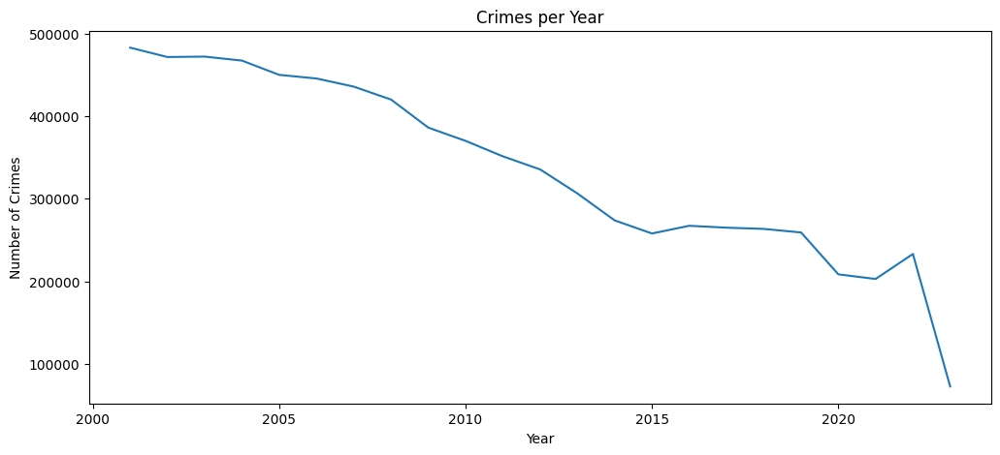

In [9]:
year_counts = df_clean['Year'].value_counts().sort_index()

plt.figure(figsize=(12,5))
sns.lineplot(x=year_counts.index, y=year_counts.values)
plt.title("Crimes per Year")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")
plt.show()

### Crimes per Month

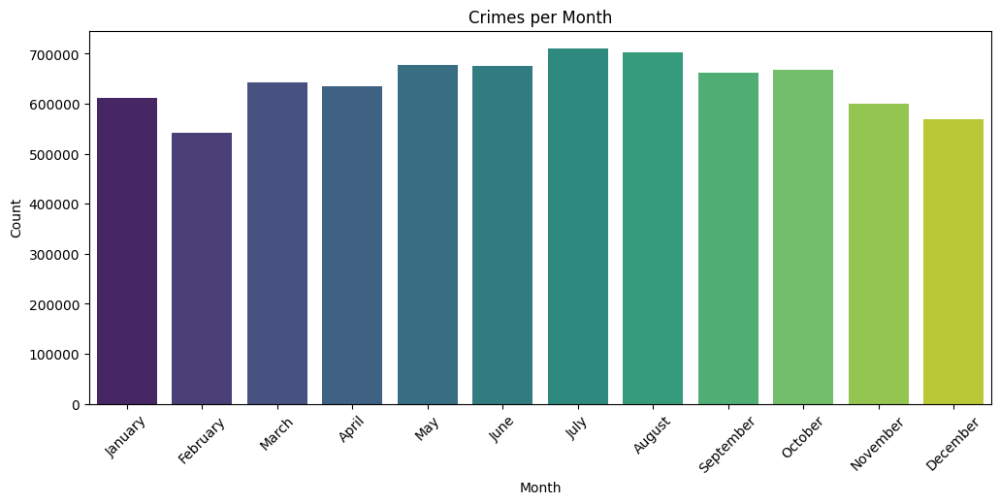

In [10]:

warnings.filterwarnings('ignore')
month_counts = df_clean['Month_Name'].value_counts()

months_order = list(calendar.month_name[1:])

df_month = pd.DataFrame({
    'Month': month_counts.index,
    'Count': month_counts.values
})

df_month['Month'] = pd.Categorical(df_month['Month'], categories=months_order, ordered=True)
df_month = df_month.sort_values('Month')

plt.figure(figsize=(12,5))
sns.barplot(x='Month', y='Count', data=df_month, palette="viridis")
plt.title("Crimes per Month")
plt.xticks(rotation=45)
plt.show()

### Crimes per Hour

<Axes: title={'center': 'Crimes per Hour'}, xlabel='Hour'>

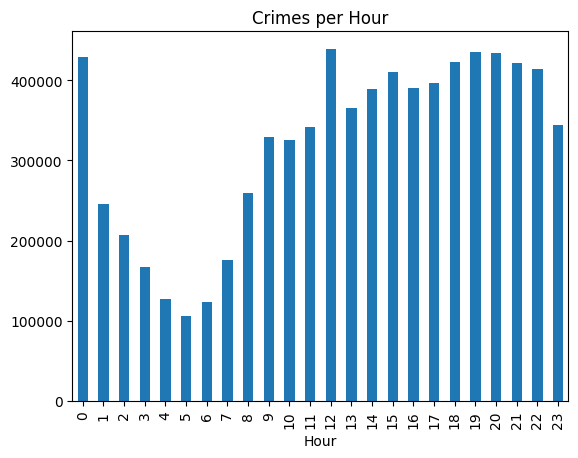

In [11]:
df_clean.groupby('Hour').size().plot(kind='bar', title='Crimes per Hour')

### Crimes by Night / Day / Weekday / Working Hours

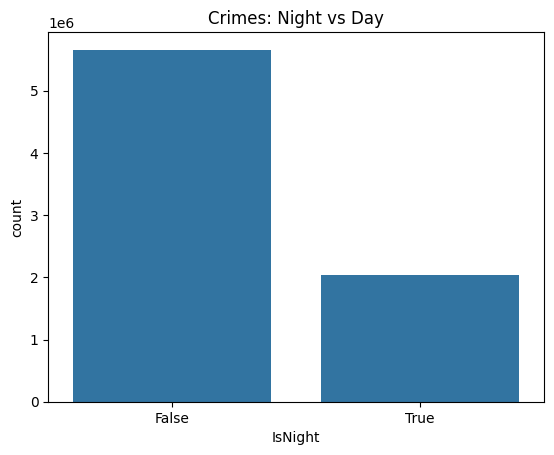

In [12]:
sns.countplot(x='IsNight', data=df_clean)
plt.title("Crimes: Night vs Day")
plt.show()

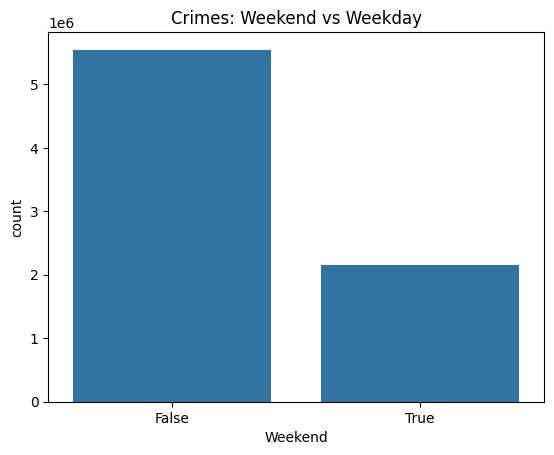

In [13]:
sns.countplot(x='Weekend', data=df_clean)
plt.title("Crimes: Weekend vs Weekday")
plt.show()

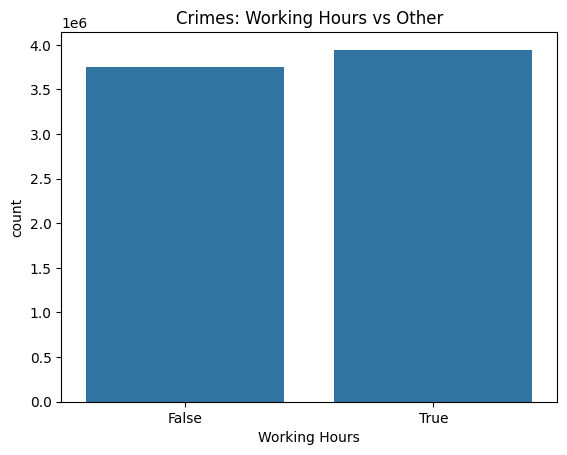

In [14]:
sns.countplot(x='Working Hours', data=df_clean)
plt.title("Crimes: Working Hours vs Other")
plt.show()

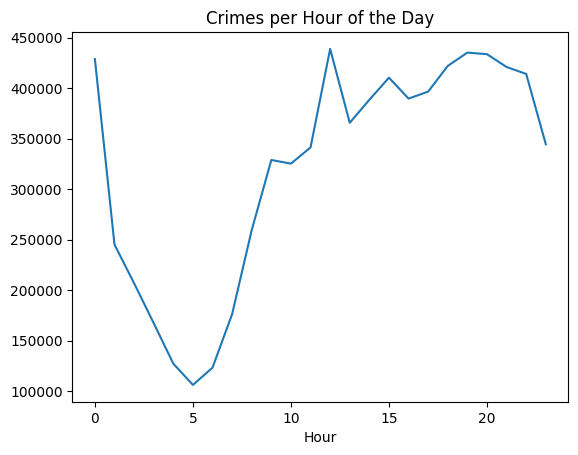

In [15]:
hour_counts = df_clean['Hour'].value_counts().sort_index()
sns.lineplot(x=hour_counts.index, y=hour_counts.values)
plt.title("Crimes per Hour of the Day")
plt.show()

In [16]:
top_crimes = df_clean['Primary Type'].value_counts().head(6).index
df_top = df_clean[df_clean['Primary Type'].isin(top_crimes)]

In [17]:
weekend_dist = (
    df_top
    .groupby(['Primary Type', 'Weekend'], as_index=False)
    .agg(count=('Primary Type', 'size'))
)

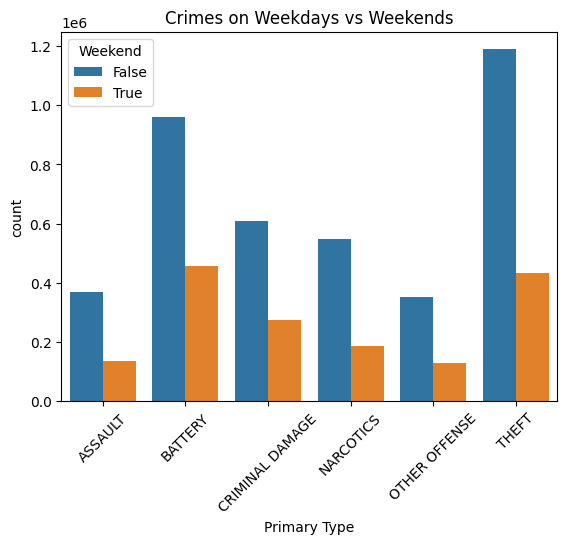

In [18]:
sns.barplot(
    data=weekend_dist,
    x='Primary Type',
    y='count',
    hue='Weekend'
)
plt.title("Crimes on Weekdays vs Weekends")
plt.xticks(rotation=45)
plt.show()

In [19]:
time_dist = (
    df_top
    .groupby('Primary Type')
    .agg(
        Working_Hours=('Working Hours', 'sum'),
        Evening=('Evening', 'sum'),
        Night=('IsNight', 'sum')
    )
)

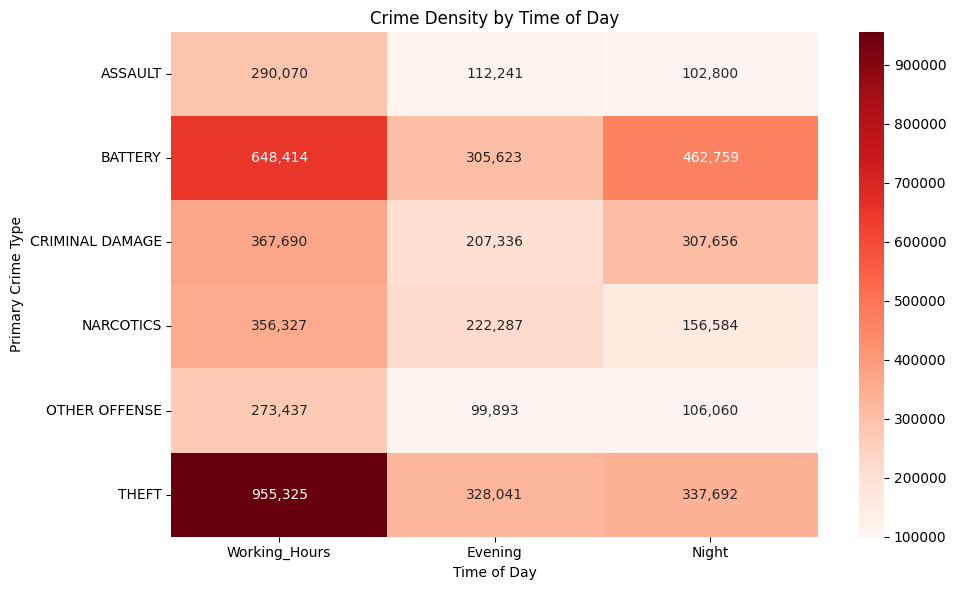

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))

sns.heatmap(
    time_dist,
    cmap='Reds',
    annot=True,
    fmt=','
)

plt.title('Crime Density by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Primary Crime Type')
plt.tight_layout()
plt.show()

### Map

In [21]:
df_map = df_clean.dropna(subset=['Latitude', 'Longitude'])

m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

for i, row in df_map.sample(2000).iterrows():
    popup_text = f"""
    Case Number: {row['Case Number']}<br>
    Primary Type: {row['Primary Type']}<br>
    Description: {row['Description']}<br>
    Date: {row['Date']}
    """
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color='red' if row['Arrest'] else 'blue',
        fill=True,
        fill_opacity=0.6,
        popup=popup_text
    ).add_to(m)

m

In [ ]:
## density map / heatmap
from folium.plugins import HeatMap

df_map = df_clean.dropna(subset=['Latitude', 'Longitude'])

m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

heat_data = df_map[['Latitude', 'Longitude']].values.tolist()

HeatMap(heat_data, radius=10, blur=15, max_zoom=13).add_to(m)

m


In [23]:
from folium.plugins import MarkerCluster

df_map = df_clean.dropna(subset=['Latitude', 'Longitude'])

m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

marker_cluster = MarkerCluster().add_to(m)

for i, row in df_map.sample(5000).iterrows(): 
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color='red' if row['Arrest'] else 'blue',
        fill=True,
        fill_opacity=0.3,
        popup=f"{row['Primary Type']}<br>Arrest: {row['Arrest']}"
    ).add_to(marker_cluster)

m

In [24]:
import requests
import folium
from folium.plugins import MarkerCluster

df_map = df_clean.dropna(subset=['Latitude', 'Longitude'])

m = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

marker_cluster = MarkerCluster().add_to(m)
for i, row in df_map.sample(500).iterrows(): 
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=4,
        color='red' if row['Arrest'] else 'blue',
        fill=True,
        fill_opacity=0.6
    ).add_to(marker_cluster)

geojson_url = "https://data.cityofchicago.org/api/geospatial/igwz-8jzy?method=export&format=GeoJSON"
geojson_data = requests.get(geojson_url).json()

folium.GeoJson(
    geojson_data,
    name="Chicago Boundary",
    style_function=lambda x: {
        'color': 'purple',
        'weight': 3,
        'fill': False
    }
).add_to(m)

m

### For top 5 crime types: what are the signature times + locations + community area for each?

#### a) Arrest vs Non-Arrest

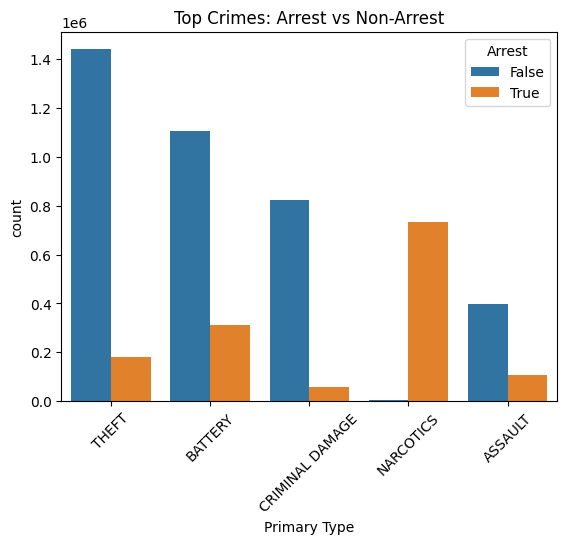

In [25]:
sns.countplot(x='Primary Type', hue='Arrest', data=df_clean, order=df_clean['Primary Type'].value_counts().index[:5])
plt.xticks(rotation=45)
plt.title("Top Crimes: Arrest vs Non-Arrest")
plt.show()

#### b) Domestic vs Non-Domestic

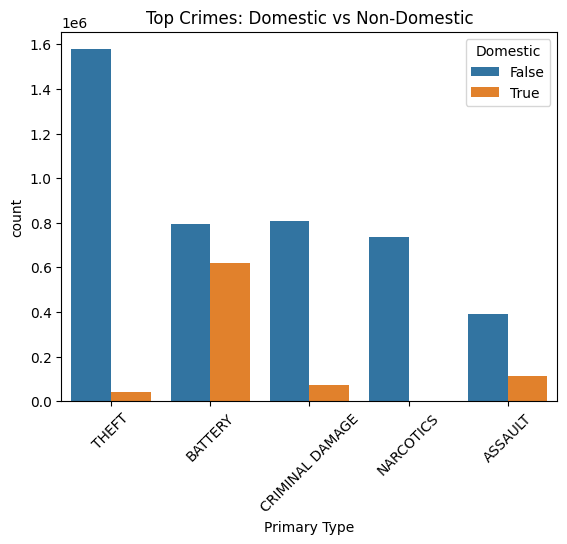

In [26]:
sns.countplot(x='Primary Type', hue='Domestic', data=df_clean, order=df_clean['Primary Type'].value_counts().index[:5])
plt.xticks(rotation=45)
plt.title("Top Crimes: Domestic vs Non-Domestic")
plt.show()

#### c) Daytime vs Nighttime

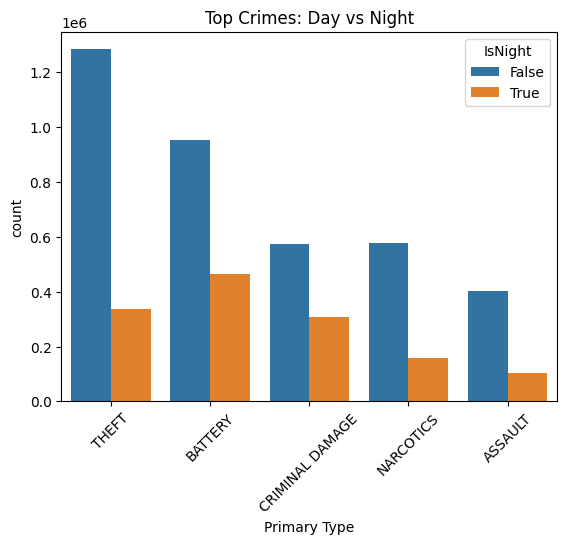

In [27]:
sns.countplot(x='Primary Type', hue='IsNight', data=df_clean, order=df_clean['Primary Type'].value_counts().index[:5])
plt.xticks(rotation=45)
plt.title("Top Crimes: Day vs Night")
plt.show()

#### d) Summer vs Winter

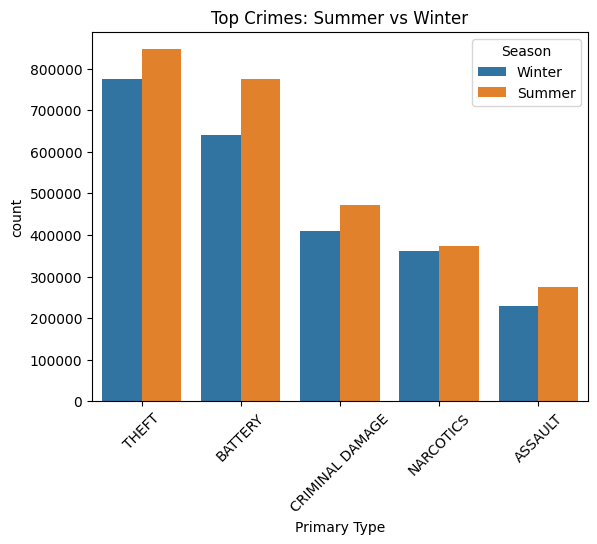

In [28]:
df_clean['Season'] = df_clean['Month'].apply(lambda x: 'Summer' if x in [3,4,5,6,7,8] else 'Winter')
sns.countplot(x='Primary Type', hue='Season', data=df_clean, order=df_clean['Primary Type'].value_counts().index[:5])
plt.xticks(rotation=45)
plt.title("Top Crimes: Summer vs Winter")
plt.show()

KeyError: 'Community Name'

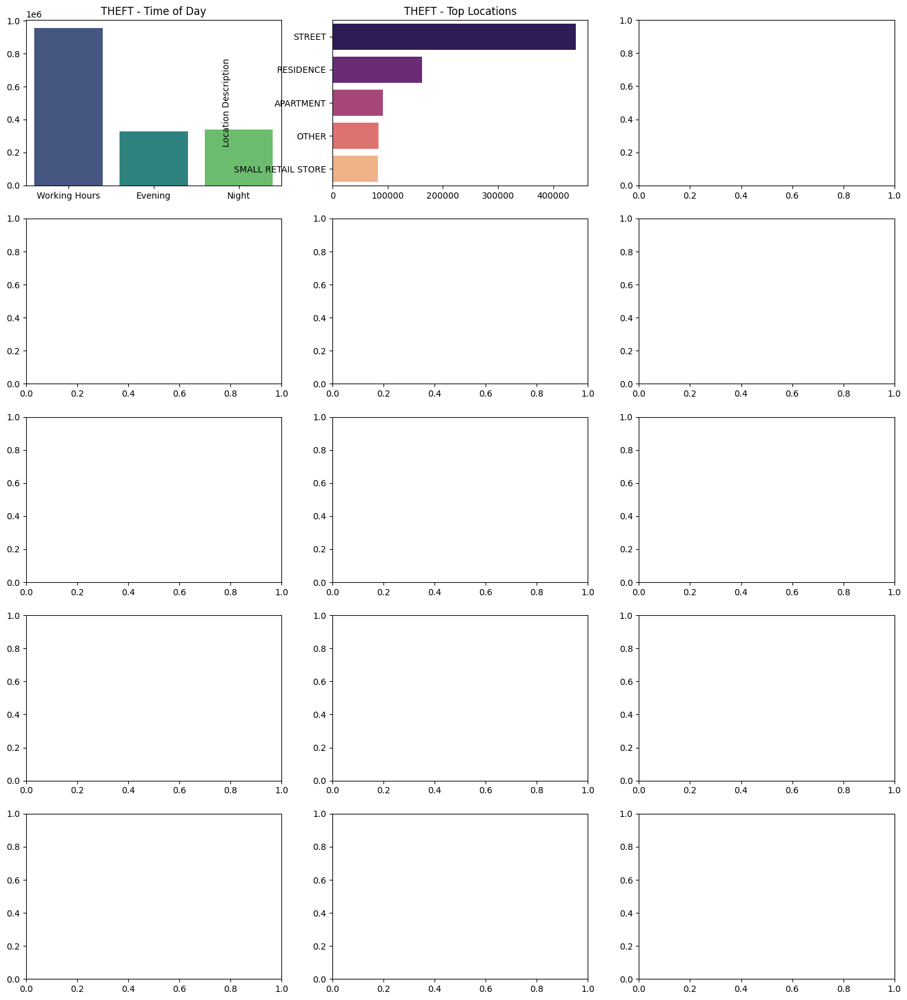

In [49]:
warnings.filterwarnings('ignore')

top5 = df_clean['Primary Type'].value_counts().index[:5]

fig, axes = plt.subplots(len(top5), 3, figsize=(18, 20))

for i, crime in enumerate(top5):
    subset = df_clean[df_clean['Primary Type'] == crime]
    
    # Time
    time_counts = {
        'Working Hours': subset['Working Hours'].sum(),
        'Evening': subset['Evening'].sum(),
        'Night': subset['IsNight'].sum()
    }
    sns.barplot(x=list(time_counts.keys()), y=list(time_counts.values()), ax=axes[i,0], palette="viridis")
    axes[i,0].set_title(f'{crime} - Time of Day')
    
    # Locations
    top_locations = subset['Location Description'].value_counts().head(5)
    sns.barplot(x=top_locations.values, y=top_locations.index, ax=axes[i,1], palette="magma")
    axes[i,1].set_title(f'{crime} - Top Locations')
    
    # Community Areas
    top_areas = subset['Community Name'].value_counts().head(5)
    sns.barplot(
        x=top_areas.values, 
        y=top_areas.index ,
        ax=axes[i,2],
        palette="coolwarm"
    )
    axes[i,2].set_title(f'{crime} - Community Area')

plt.tight_layout()
plt.show()

# Part 2

In [50]:
#simiosi gia sxoliasoume gia to domestic violence p einai mono 1 incident
top10_overall = df_clean['Primary Type'].value_counts()
top10_overall.head(10)

Primary Type
THEFT                  1621058
BATTERY                1416796
CRIMINAL DAMAGE         882682
NARCOTICS               735198
ASSAULT                 505111
OTHER OFFENSE           479390
BURGLARY                422718
MOTOR VEHICLE THEFT     372060
DECEPTIVE PRACTICE      326375
ROBBERY                 290847
Name: count, dtype: int64

In [51]:
df_clean['Year'].agg(['min', 'max'])

min    2001
max    2023
Name: Year, dtype: int64

In [52]:
year_type = df_clean.groupby(['Year', 'Primary Type']).size()
year_type_sorted = year_type.sort_values(ascending=False)
top10_per_year = year_type_sorted.groupby(level=0).head(10)
top10_per_year

Year  Primary Type      
2001  THEFT                 98447
2003  THEFT                 97804
2002  THEFT                 95363
2004  THEFT                 94642
2001  BATTERY               93050
                            ...  
2023  OTHER OFFENSE          4654
      DECEPTIVE PRACTICE     4616
      ROBBERY                2649
      WEAPONS VIOLATION      2517
      BURGLARY               2150
Length: 230, dtype: int64

In [53]:
print("2001")
print(top10_per_year.loc[2001])

print("\n2022")
print(top10_per_year.loc[2022])

2001
Primary Type
THEFT                  98447
BATTERY                93050
CRIMINAL DAMAGE        55590
NARCOTICS              50318
ASSAULT                31260
OTHER OFFENSE          29558
MOTOR VEHICLE THEFT    27282
BURGLARY               25943
ROBBERY                18292
DECEPTIVE PRACTICE     14774
dtype: int64

2022
Primary Type
THEFT                  53141
BATTERY                40689
CRIMINAL DAMAGE        26912
MOTOR VEHICLE THEFT    21261
ASSAULT                20691
DECEPTIVE PRACTICE     14753
OTHER OFFENSE          14228
ROBBERY                 8952
WEAPONS VIOLATION       8697
BURGLARY                7515
dtype: int64


In [54]:
df_full = df_clean[df_clean["Year"].between(2001, 2022)]
df_full["Year"].min(), df_full["Year"].max()
top_types = df_full["Primary Type"].value_counts().head(10).index
top_types

Index(['THEFT', 'BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS', 'ASSAULT',
       'OTHER OFFENSE', 'BURGLARY', 'MOTOR VEHICLE THEFT',
       'DECEPTIVE PRACTICE', 'ROBBERY'],
      dtype='object', name='Primary Type')

In [55]:
year_type_table = (
    df_full[df_full["Primary Type"].isin(top_types)]
    .groupby(["Year", "Primary Type"])
    .size()
    .unstack(fill_value=0)
)

year_type_table.head()

Primary Type,ASSAULT,BATTERY,BURGLARY,CRIMINAL DAMAGE,DECEPTIVE PRACTICE,MOTOR VEHICLE THEFT,NARCOTICS,OTHER OFFENSE,ROBBERY,THEFT
Year,,,,,,,,,,
2001,31260,93050,25943,55590,14774,27282,50318,29558,18292,98447
2002,30733,91721,25221,54709,13237,23255,49824,31806,17740,95363
2003,29292,87835,25010,54694,13255,22676,53763,30912,17235,97804
2004,28792,86966,24520,53070,13078,22747,56882,29455,15951,94642
2005,26965,83637,25413,54351,13153,22384,55950,27829,15988,84304


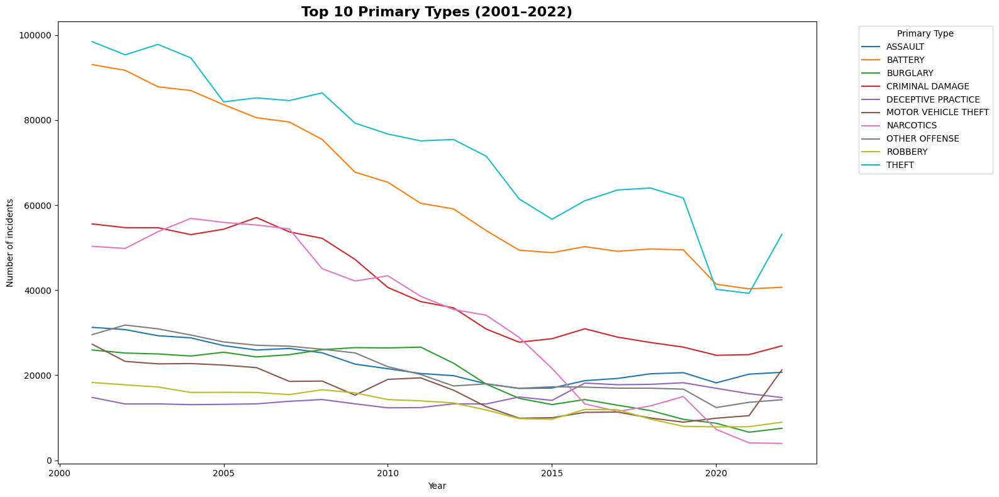

In [56]:
plt.figure(figsize=(16,8))  
year_type_table.plot(ax=plt.gca()) 
plt.title("Top 10 Primary Types (2001–2022)", fontsize=16, weight='bold')
plt.xlabel("Year")
plt.ylabel("Number of incidents")

plt.legend(title="Primary Type", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout() 
plt.show()

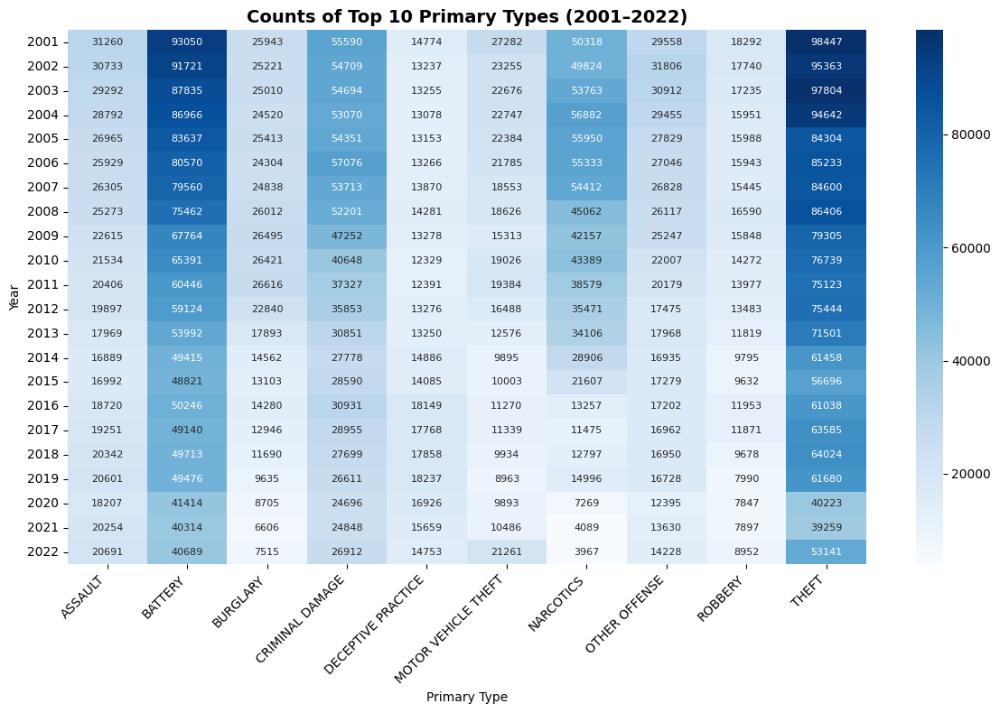

In [57]:
plt.figure(figsize=(12,8))
sns.heatmap(
    year_type_table, 
    cmap="Blues", 
    annot=True,             
    fmt="d",                
    annot_kws={"size":8}   
)
plt.title("Counts of Top 10 Primary Types (2001–2022)", fontsize=14, weight="bold")
plt.xlabel("Primary Type")
plt.ylabel("Year")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

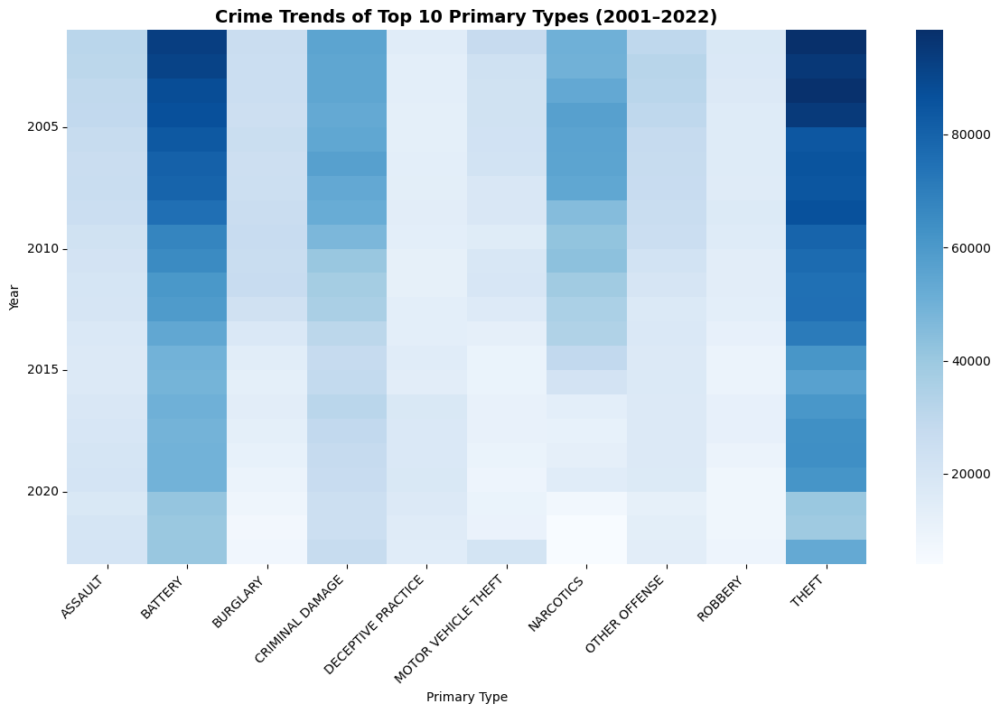

In [59]:
plt.figure(figsize=(12,8))

ax = sns.heatmap(
    year_type_table, 
    cmap="Blues"
)

plt.title("Crime Trends of Top 10 Primary Types (2001–2022)", fontsize=14, weight="bold")
plt.xlabel("Primary Type")
plt.ylabel("Year")

years = year_type_table.index
tick_positions = [i for i, y in enumerate(years) if y % 5 == 0]

ax.set_yticks(tick_positions)
ax.set_yticklabels([years[i] for i in tick_positions])

plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.savefig('heatmap_no_values.png', transparent=True, bbox_inches='tight')
plt.show()

##### Are there seasonal peaks (Summer_Spring vs Winter_Autumn)? Which crimes are most seasonal?

In [40]:
df_sw = df_clean[df_clean["Season"].isin(["Summer", "Winter"])]
df_sw["Season"].value_counts()

Season
Summer    4044439
Winter    3653374
Name: count, dtype: int64

In [41]:
season_counts = (
    df_sw.groupby(["Primary Type", "Season"])
    .size()
    .unstack(fill_value=0)
)
season_counts.head(10)

Season,Summer,Winter
Primary Type,,
ARSON,7226,5936
ASSAULT,275710,229401
BATTERY,776189,640607
BURGLARY,213621,209097
CONCEALED CARRY LICENSE VIOLATION,560,517
CRIM SEXUAL ASSAULT,13854,12290
CRIMINAL DAMAGE,472430,410252
CRIMINAL SEXUAL ASSAULT,3114,2782
CRIMINAL TRESPASS,109114,104155


In [61]:
season_counts.sort_values(by='Summer', ascending=False).head(3)

Season,Summer,Winter,abs_diff
Primary Type,,,
THEFT,846289,774769,71520
BATTERY,776189,640607,135582
CRIMINAL DAMAGE,472430,410252,62178


In [62]:
# Sort by Winter and show top results
season_counts.sort_values(by='Winter', ascending=False).head(3)

Season,Summer,Winter,abs_diff
Primary Type,,,
THEFT,846289,774769,71520
BATTERY,776189,640607,135582
CRIMINAL DAMAGE,472430,410252,62178


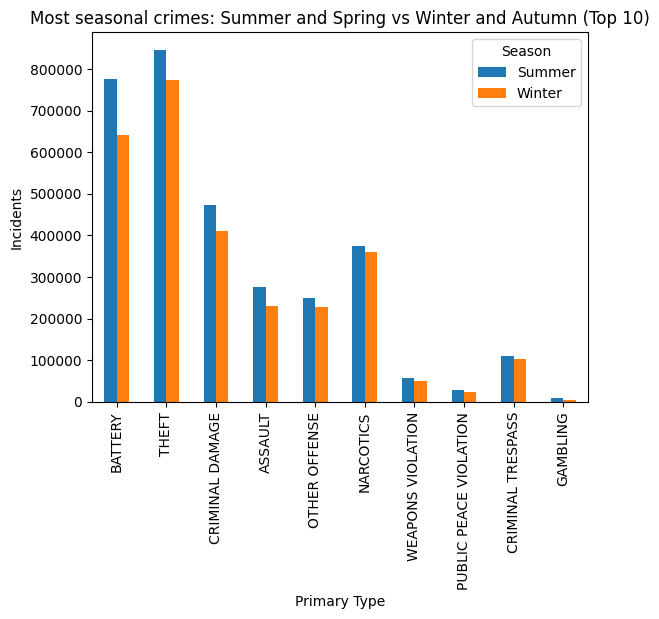

In [42]:
season_counts["abs_diff"] = (season_counts["Summer"] - season_counts["Winter"]).abs()
season_counts.sort_values("abs_diff", ascending=False).head(10)
top = season_counts.sort_values("abs_diff", ascending=False).head(10)
top[["Summer","Winter"]].plot(kind="bar")
plt.title("Most seasonal crimes: Summer and Spring vs Winter and Autumn (Top 10)")
plt.ylabel("Incidents")
plt.show()

In [43]:
df_clean[["Arrest","Domestic"]].dtypes

Arrest      bool
Domestic    bool
dtype: object

##### Top 10 crime types by: count, arrest rate, domestic rate

In [44]:
#Top 10 by count
top10_count = df_clean["Primary Type"].value_counts().head(10)
top10_count

Primary Type
THEFT                  1621058
BATTERY                1416796
CRIMINAL DAMAGE         882682
NARCOTICS               735198
ASSAULT                 505111
OTHER OFFENSE           479390
BURGLARY                422718
MOTOR VEHICLE THEFT     372060
DECEPTIVE PRACTICE      326375
ROBBERY                 290847
Name: count, dtype: int64

In [45]:
#Top 10 by arrest rate
arrest_rate = df_clean.groupby("Primary Type")["Arrest"].mean().sort_values(ascending=False)
top10_arrest_rate = arrest_rate.head(10)
top10_arrest_rate

Primary Type
DOMESTIC VIOLENCE                    1.000000
PROSTITUTION                         0.996126
NARCOTICS                            0.994301
GAMBLING                             0.993388
LIQUOR LAW VIOLATION                 0.991734
PUBLIC INDECENCY                     0.989691
CONCEALED CARRY LICENSE VIOLATION    0.962860
INTERFERENCE WITH PUBLIC OFFICER     0.921015
OBSCENITY                            0.798969
WEAPONS VIOLATION                    0.742256
Name: Arrest, dtype: float64

In [46]:
#or
counts = df_clean["Primary Type"].value_counts()
valid_types = counts[counts >= 1000].index  
top10_arrest_rate = (
    df_clean[df_clean["Primary Type"].isin(valid_types)]
    .groupby("Primary Type")["Arrest"].mean()
    .sort_values(ascending=False)
    .head(10)
)
top10_arrest_rate

Primary Type
PROSTITUTION                         0.996126
NARCOTICS                            0.994301
GAMBLING                             0.993388
LIQUOR LAW VIOLATION                 0.991734
CONCEALED CARRY LICENSE VIOLATION    0.962860
INTERFERENCE WITH PUBLIC OFFICER     0.921015
WEAPONS VIOLATION                    0.742256
CRIMINAL TRESPASS                    0.701630
PUBLIC PEACE VIOLATION               0.631370
HOMICIDE                             0.472581
Name: Arrest, dtype: float64

In [47]:
domestic_rate = df_clean.groupby("Primary Type")["Domestic"].mean().sort_values(ascending=False)
top10_domestic_rate = domestic_rate.head(10)
top10_domestic_rate

Primary Type
DOMESTIC VIOLENCE                   1.000000
NON-CRIMINAL (SUBJECT SPECIFIED)    0.777778
OFFENSE INVOLVING CHILDREN          0.540133
BATTERY                             0.438716
STALKING                            0.425464
OTHER OFFENSE                       0.300668
KIDNAPPING                          0.275154
RITUALISM                           0.260870
ASSAULT                             0.229015
CRIMINAL SEXUAL ASSAULT             0.183175
Name: Domestic, dtype: float64

In [ ]:
summary = df_clean.groupby("Primary Type").agg(
    count=("Primary Type","size"),
    arrest_rate=("Arrest","mean"),
    domestic_rate=("Domestic","mean"),
)
summary.head()

In [ ]:
summary.sort_values("count", ascending=False).head(10)
summary.sort_values("arrest_rate", ascending=False).head(10)
summary.sort_values("domestic_rate", ascending=False).head(10)

In [ ]:
ax = top10_count.sort_values().plot(kind="barh")
ax.set_xlabel("Incidents")
ax.set_ylabel("Primary Type")
ax.set_title("Top 10 Primary Types by Count")
plt.tight_layout()
plt.show()

In [ ]:
ax = top10_arrest_rate.sort_values().plot(kind="barh")
ax.set_xlabel("Arrest rate")
ax.set_title("Top 10 Primary Types by Arrest Rate")
plt.tight_layout()
plt.show()


In [ ]:
ax = top10_domestic_rate.sort_values().plot(kind="barh")
ax.set_title("Top 10 Crime Types by Domestic Rate (2001–2022)")
ax.set_xlabel("Domestic rate (share of incidents with Domestic=True)")
ax.set_ylabel("Primary Type")
plt.tight_layout()
plt.show()

# Part 3

In [ ]:
df_sample = df_clean.sample(n=200_000, random_state=42)

### Primary Type with Arrests rates

In [ ]:
# Group by Primary Type and calculate total incidents and arrests
arrest_stats = df_sample.groupby('Primary Type').agg(
    total_incidents=('Arrest', 'count'),
    total_arrests=('Arrest', 'sum')
).reset_index()

arrest_stats['arrest_rate'] = arrest_stats['total_arrests'] / arrest_stats['total_incidents']

arrest_stats = arrest_stats.sort_values(by='arrest_rate', ascending=False)

In [ ]:
plt.figure(figsize=(14,8))

scatter = sns.scatterplot(
    data=arrest_stats,
    x='total_incidents',
    y='arrest_rate',
    hue='Primary Type',        
    palette='tab20',          
    s=100,                     
    alpha=0.8
)

plt.xscale('log')

plt.xlabel('Total Incidents (log scale)', fontsize=12)
plt.ylabel('Arrest Rate', fontsize=12)
plt.title('Arrest Rate vs Total Incidents by Crime Type', fontsize=14)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Primary Type', fontsize=10)

plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

avg_rate = arrest_stats['arrest_rate'].mean()

plt.figure(figsize=(14,10))

plt.hlines(
    y=arrest_stats['Primary Type'],
    xmin=avg_rate,
    xmax=arrest_stats['arrest_rate'],
    color='skyblue',
    alpha=0.6
)

plt.scatter(arrest_stats['arrest_rate'], arrest_stats['Primary Type'], color='navy', s=100)
plt.scatter([avg_rate]*len(arrest_stats), arrest_stats['Primary Type'], color='orange', s=50, label='Average Rate')

plt.gca().xaxis.set_major_formatter(PercentFormatter(1.0))

plt.xlim(-0.02, 1.02)

plt.xlabel('Arrest Rate')
plt.title('Dumbbell Chart: Arrest Rate vs Average by Crime Type', fontsize=16, weight='bold')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np

categories = arrest_stats['Primary Type']
values = arrest_stats['arrest_rate']

angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()

values = np.append(values.values, values.values[0])
angles = np.append(angles, angles[0])

plt.figure(figsize=(12,12))
ax = plt.subplot(111, polar=True)
ax.plot(angles, values, color='teal', linewidth=2, marker='o')
ax.fill(angles, values, color='teal', alpha=0.25)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=9)
ax.set_yticks(np.linspace(0, 1, 6))
ax.set_yticklabels([f"{x:.0%}" for x in np.linspace(0, 1, 6)])
plt.title('Polar Plot: Arrest Rates by Crime Type', fontsize=16, weight='bold')
plt.show()

In [ ]:
top_n = 20
top_stats = arrest_stats.sort_values('arrest_rate', ascending=False).head(top_n)

categories = top_stats['Primary Type']
values = top_stats['arrest_rate']

angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
values = np.append(values.values, values.values[0])
angles = np.append(angles, angles[0])

plt.figure(figsize=(12,12))
ax = plt.subplot(111, polar=True)
ax.plot(angles, values, color='teal', linewidth=2, marker='o')
ax.fill(angles, values, color='teal', alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=10)

# Περιστροφή labels έξω από τον κύκλο
for label, angle in zip(ax.get_xticklabels(), angles):
    angle_deg = np.degrees(angle)
    if angle_deg >= 90 and angle_deg <= 270:
        label.set_rotation(angle_deg + 180)
        label.set_horizontalalignment('right')
    else:
        label.set_rotation(angle_deg)
        label.set_horizontalalignment('left')

ax.set_yticks(np.linspace(0, 1, 6))
ax.set_yticklabels([f"{x:.0%}" for x in np.linspace(0, 1, 6)])

plt.title(f'Polar Plot: Arrest Rates by Crime Type (Top {top_n})', fontsize=16, weight='bold')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import numpy as np

avg_rate = arrest_stats['arrest_rate'].mean()

arrest_stats_sorted = arrest_stats.sort_values(by='arrest_rate', ascending=True).reset_index(drop=True)

arrest_stats_sorted['color'] = 'skyblue'

plt.figure(figsize=(14,12))

for idx, row in arrest_stats_sorted.iterrows():
    plt.plot([avg_rate, row['arrest_rate']], [row['Primary Type'], row['Primary Type']],
             color='lightgray', linewidth=1, zorder=0)

plt.scatter(
    arrest_stats_sorted['arrest_rate'],
    arrest_stats_sorted['Primary Type'],
    s=np.sqrt(arrest_stats_sorted['total_incidents'])*5,
    c=arrest_stats_sorted['color'],
    edgecolor='k',
    alpha=0.8
)

plt.scatter([avg_rate]*len(arrest_stats_sorted), arrest_stats_sorted['Primary Type'],
            color='orange', s=50, label='Average Arrest Rate', zorder=2)

plt.gca().xaxis.set_major_formatter(PercentFormatter(1.0))
plt.xlim(-0.02, 1.02) 

plt.xlabel('Arrest Rate', fontsize=12)
plt.ylabel('Primary Type', fontsize=12)
plt.title('Dumbbell Chart: Arrest Rate vs Average by Crime Type\nDot Size = Total Incidents', fontsize=16, weight='bold')
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### Crime Types Rising and Falling

###### Which crime types are rising and which are falling over time?

In [ ]:
crime_types_per_year = (df_clean.groupby(['Year', 'Primary Type']).size().reset_index(name='crime_count'))
crime_types_per_year = crime_types_per_year.sort_values(['Primary Type', 'Year'])
first_last = (crime_types_per_year.groupby('Primary Type').agg(first_year_count=('crime_count', 'first'),last_year_count=('crime_count', 'last'))
.reset_index())

In [ ]:
first_last['absolute_change'] = first_last['last_year_count'] - first_last['first_year_count']
first_last['percent_change'] = (first_last['absolute_change'] / first_last['first_year_count']) * 100

In [ ]:
rising_crimes = first_last.sort_values('absolute_change', ascending=False)
falling_crimes = first_last.sort_values('absolute_change')

In [ ]:
max_date = df_clean['Year'].max()
max_date

In [ ]:
plot_df = crime_types_per_year[crime_types_per_year['Year'] <= 2022]
all_crimes = plot_df['Primary Type'].unique()
all_crimes

In [ ]:
top20_crimes = plot_df['Primary Type'].value_counts().head(7).index

plt.figure(figsize=(14,8))

for crime in top20_crimes:
    subset = plot_df[plot_df['Primary Type'] == crime]
    plt.plot(subset['Year'], subset['crime_count'], marker='o', label=crime)

plt.title('Trends of Top 20 Crime Types Over Time (Up to 2022)')
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.xticks(sorted(plot_df['Year'].unique()))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.grid(True)
plt.tight_layout()
plt.show()

#### Rate change 2002 - 2022

In [ ]:
crimes_2002 = df_clean[df_clean["Year"] == 2002].shape[0]

In [ ]:
crimes_2022 = df_clean[df_clean["Year"] == 2022].shape[0]

In [ ]:
rate_drop = ((crimes_2022 - crimes_2002) / crimes_2002) * 100

In [ ]:
print(f"Rate change 2002 → 2022: {rate_drop:.2f}%")